# Preprocessing
In the original algorithm, the image preprocessing has two parts: first, histogram equalization and sharpening, then selectively brightening sea ice and darkening interstitial ice. 

The ice brightening section is described in the paper as
1. Divide the image into 9 subsections
2. Using band 7 to indicate cloud brightness,
   1. if mean$(b7 > 110) < 20\%$: compute standard deviation of pixels with brightness over 110. If the standard deviation is larger than 100, the increase the brightness of every pixel with $b7 > 125$ by $30\%$.
   2. else brighten pixels with $b7 > 175$.
3. Binarize the image using $k$-means. Use $k=4$, and select the group with $b7 \approx 0$ and $b1 \approx 255$. The ice-water discriminated image and the binarized image are then sent to the watershed segmentation algorithm.

The ambiguity here is which channel is brightened. Reading the paper, it's not clear if it's band 7 or if it's all the bands or what.

Next, the algorithm in LopezAcosta2019 has component functions (to update and rename):
- imsharpen
- imsharpen_gray
- normalize_image
- discriminate_ice_water



In [2]:
using Pkg
Pkg.activate("calval")
Pkg.add(;name="IceFloeTracker", rev="main") # potentially lets me use the dev version!
using Images
using IceFloeTracker
using CSV
# Pkg.add("CairoMakie")
using CairoMakie
using DataFrames
using Peaks

  Activating project at `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval`
    Updating git-repo `https://github.com/WilhelmusLab/IceFloeTracker.jl.git`
   Resolving package versions...
    Updating `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval/Project.toml`
  [04643c7a] ~ IceFloeTracker v0.9.0 `https://github.com/WilhelmusLab/IceFloeTracker.jl.git#main` ⇒ v0.9.0 `https://github.com/WilhelmusLab/IceFloeTracker.jl.git#main`
    Updating `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval/Manifest.toml`
  [04643c7a] ~ IceFloeTracker v0.9.0 `https://github.com/WilhelmusLab/IceFloeTracker.jl.git#main` ⇒ v0.9.0 `https://github.com/WilhelmusLab/IceFloeTracker.jl.git#main`
Precompiling project...
   8316.6 ms  ✓ IceFloeTracker
  1 dependency successfully precompiled in 11 seconds. 491 already precompiled.


In [3]:
Pkg.resolve()

  No Changes to `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval/Project.toml`
  No Changes to `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval/Manifest.toml`


# To do:
* Move segmentation stuff out of here
* Verify the preprocessing quality against validation images

# Parameters and cloud mask

In [4]:
using IceFloeTracker: nonlinear_diffusion, Watkins2025CloudMask
using IceFloeTracker.Filtering: PeronaMalikDiffusion # This should be exported in main, I think
using IceFloeTracker: fill_holes
using StatsBase

In [5]:
new_cmask = Watkins2025CloudMask();

Preprocessing
* The goal is to make a version of the image that has sharper boundaries without making the floe interior too noisy.
* We have the option to remove the clouds now or later, I'm considering doing this later in the segmentation steps
* Filtering tiles based just on whether any ocean pixels are present after dilating the land mask.

In [51]:
include("../scripts/dev/preprocess.jl")


preprocess_image

In [20]:
# What could be added still:
# Land mask application inside function
# Tile filtering application outside of function
# PMD as an input to the function
# May need to add in the "brightening" kind of thing, or compute a residue -- the boundaries
# may not be as good 

In [265]:

# # Tests on 500 km by 500 km images
subset = (500:1500, 500:1500)
# tc_img = RGB.(load("../data/validation_dataset/modis_500km/truecolor/128-hudson_bay-500km-20190415-aqua-250m-truecolor.tiff"))[subset...]
# fc_img = RGB.(load("../data/validation_dataset/modis_500km/falsecolor/128-hudson_bay-500km-20190415-aqua-250m-falsecolor.tiff"))[subset...]
# lm_img = RGB.(load("../data/validation_dataset/modis_500km/landmask/128-hudson_bay-500km-20190415-250m-landmask.tiff"))[subset...]

tc_img = RGB.(load("../data/validation_dataset/modis_500km/truecolor/106-greenland_sea-500km-20140911-aqua-250m-truecolor.tiff"))[subset...]
fc_img = RGB.(load("../data/validation_dataset/modis_500km/falsecolor/106-greenland_sea-500km-20140911-aqua-250m-falsecolor.tiff"))[subset...]
lm_img = RGB.(load("../data/validation_dataset/modis_500km/landmask/106-greenland_sea-500km-20140911-250m-landmask.tiff"))[subset...]


# Test on small images
case_number = 9
satellite = "aqua"
data_loader = Watkins2025GitHub(; ref="1d36f82a5cb337839ab039bffca8961a97241c22")
dataset = data_loader(c -> c.case_number == case_number && c.satellite == satellite);
case = first(dataset);

# tc_img = RGB.(case.modis_truecolor)
# fc_img = RGB.(case.modis_falsecolor)
# lm_img = case.modis_landmask

land_mask = IceFloeTracker.create_landmask(lm_img, strel_diamond((3,3)))
cloud_mask = IceFloeTracker.create_cloudmask(fc_img, new_cmask)

tile_size_pixels = 200
maximum_land_fraction = 0.75
maximum_cloud_fraction = 0.9

tiles = IceFloeTracker.get_tiles(tc_img, tile_size_pixels)

# Select a subset of the tiles to preprocess
filtered_tiles = filter(
    t -> mean(land_mask.dilated[t...]) < maximum_land_fraction &&
             mean(cloud_mask[t...]) < maximum_cloud_fraction, tiles)

17-element Vector{Tuple{UnitRange{Int64}, UnitRange{Int64}}}:
 (1:200, 1:200)
 (201:400, 1:200)
 (401:600, 1:200)
 (601:800, 1:200)
 (801:1001, 1:200)
 (1:200, 201:400)
 (201:400, 201:400)
 (401:600, 201:400)
 (601:800, 201:400)
 (801:1001, 201:400)
 (201:400, 401:600)
 (801:1001, 401:600)
 (1:200, 601:800)
 (601:800, 601:800)
 (801:1001, 601:800)
 (1:200, 801:1001)
 (801:1001, 801:1001)

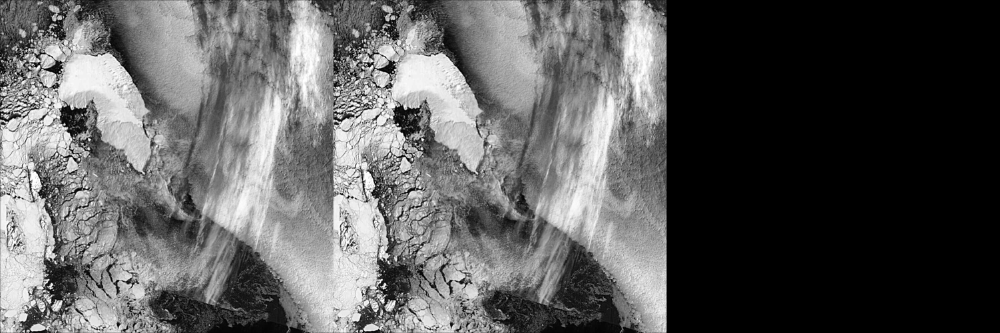

In [279]:
# Original preprocessing scheme
init_grayscale = float64.(Gray.(adjust_histogram(tc_img, AdaptiveEqualization(clip=0.7, rblocks=3, cblocks=3)) |> unsharp_mask))
tiles = IceFloeTracker.get_tiles(tc_img, tile_size_pixels) # original used 3x3, but with larger images
updated_grayscale = deepcopy(init_grayscale)
for tile in tiles
    b7 = red.(fc_img)[tile...]
    gr = init_grayscale[tile...]
    mean(vec(b7 .> 110/255)) < 0.2 ? (thresh = 125/255) : (thresh = 175/255)
    sigma7 = std(vec(gr[gr .> 110/255]))
    if sigma7 > 100/255
        print("brightening")
        initial_segment = updated_grayscale[tile...]
        initial_segment[gr .> thresh] .= 1.3 .* initial_segment[gr .> thresh]
        updated_grayscale[tile...] .= clamp.(initial_segment, 0, 1)
    end
end
mosaicview(init_grayscale, updated_grayscale, Gray.(updated_grayscale .!= init_grayscale), nrow=1)

In [270]:
0.14 * 255

35.7

16.559097

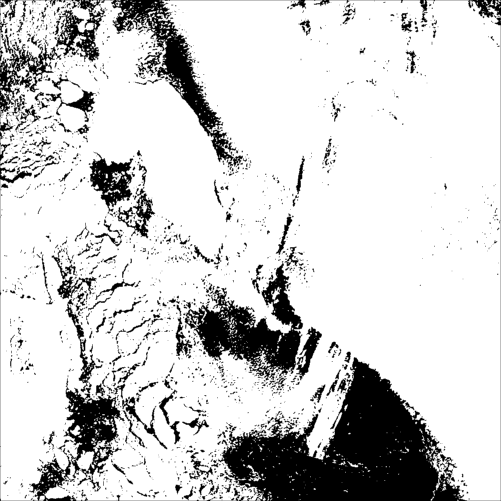

In [277]:
b7 = red.(fc_img)
print(std(vec(b7[b7 .> 110/255] * 255)))
Gray.(init_grayscale .> 110/255)

In [273]:
# initial_morphed = load("../data/validation_dataset/morphological_residue/128-hudson_bay-100km-20190415.aqua.morphed_residue.250m.tiff")
morphed_gray = preprocess_image(tc_img, cloud_mask, land_mask, filtered_tiles);

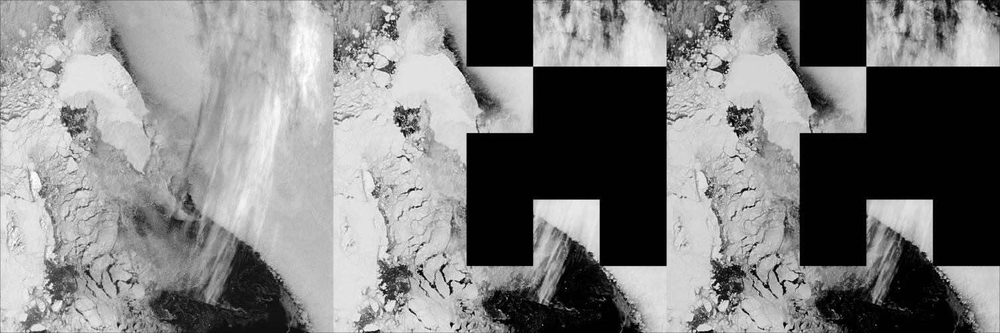

In [276]:
morphed_adjusted = deepcopy(morphed_gray)
for tile in tiles
    morphed_adjusted[tile...] = adjust_histogram(morphed_gray[tile...], GammaCorrection(1.5))
end

# adj_mask = morphed_gray .> (1-220)/255
# morphed_adjusted[adj_mask] .= morphed_adjusted_temp[adj_mask]
# mosaicview(red.(tc_img), initial_morphed, morphed_gray, morphed_adjusted, nrow=2)
mosaicview(red.(tc_img), morphed_gray, morphed_adjusted, nrow=1)

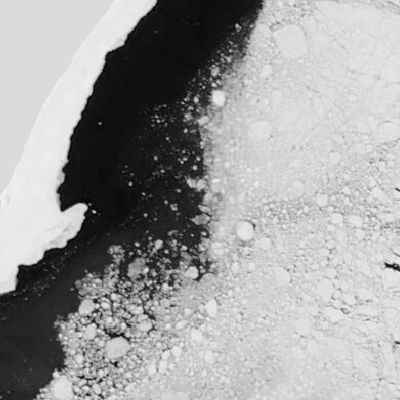

In [111]:
test_im = red.(tc_img)
test_im[land_mask.non_dilated] .= mean(test_im[land_mask.dilated])
Gray.(test_im)

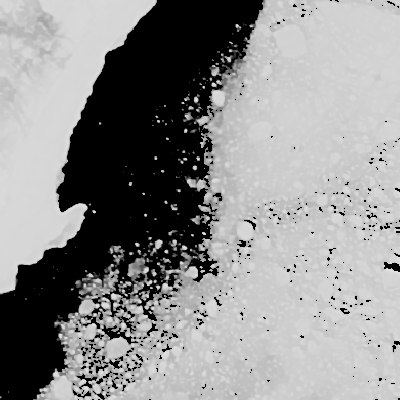

In [132]:
tiled_adpt = Gray.(tiled_adaptive_binarization(test_im, tiles))
morphed_adjusted[tiled_adpt .< 1] .*= 0
Gray.(morphed_adjusted)

In [141]:

land_mask = IceFloeTracker.create_landmask(lm_img, strel_diamond((3,3)))
cloud_mask = IceFloeTracker.create_cloudmask(fc_img, new_cmask)

tile_size_pixels = 200
maximum_land_fraction = 0.75
maximum_cloud_fraction = 0.9

tiles = IceFloeTracker.get_tiles(tc_img, tile_size_pixels)

# Select a subset of the tiles to preprocess
filtered_tiles = filter(
    t -> mean(land_mask.dilated[t...]) < maximum_land_fraction &&
             mean(cloud_mask[t...]) < maximum_cloud_fraction, tiles);

In [58]:
morphed_gray = preprocess_image(tc_img, cloud_mask, land_mask, filtered_tiles);

In [143]:
# cast to float to avoid issues with N0f8 integer rollover
reconstructed_complement = float64.(complement.(morphed_gray))
init_green = float64.(green.(tc_img))
# bright areas in the reconstructed complement are water and interstitial ice.
adjustment_mask = (reconstructed_complement .- init_green ) .> 0
reconstructed_complement[adjustment_mask] .=  clamp.(1.2 .* reconstructed_complement[adjustment_mask], 0, 1);
# clamp!(reconstructed_complement, 0, 1)
save("test_brighten.png", mosaicview(morphed_gray, complement.(reconstructed_complement), nrow=1))

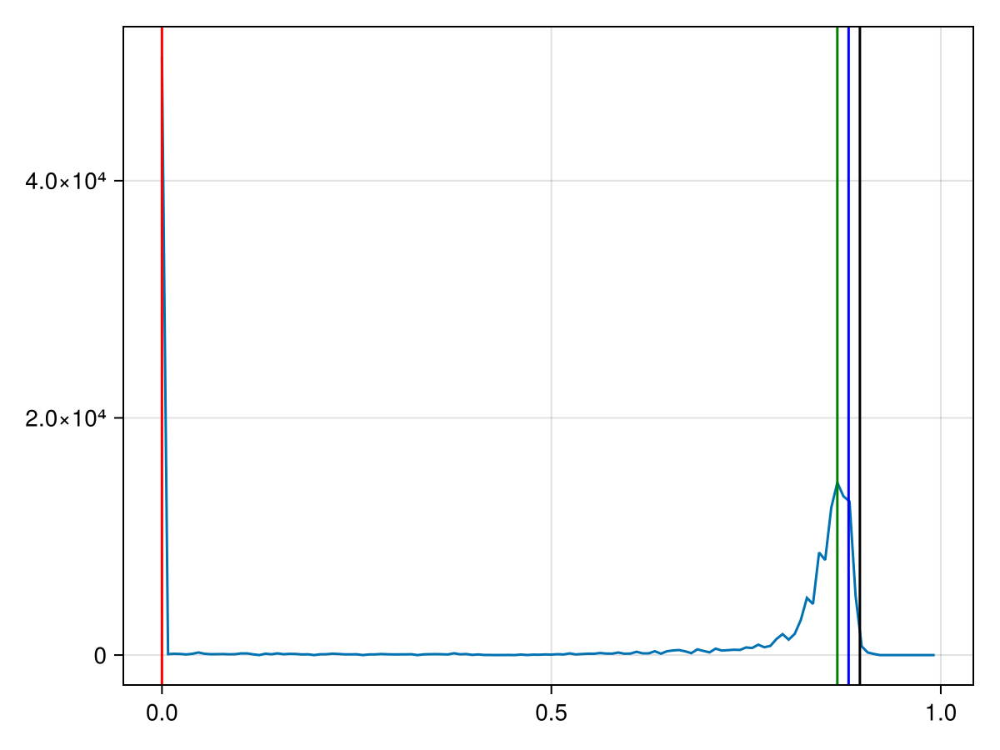

In [146]:
# One method we could use is to find the peaks and then stretch the image. 
# But that may be overkill.
img = complement.(reconstructed_complement)
edges, bin_counts = build_histogram(img .* .! land_mask.non_dilated, 128; minval=0, maxval=1)
window = 3
pks = findmaxima(bin_counts, window) |> peakproms! |> peakwidths!
pks_df = DataFrame(pks[Not(:data)])
pks_df = sort(pks_df, :proms, rev=true)
mx, argmx = findmax(pks_df.proms)
bright_peak = edges[pks_df[argmx, :indices]]
land = vec(land_mask.non_dilated) .> 0
pct05 = percentile(vec(img)[.!land], 5)
pct99 = percentile(vec(img)[.!land], 99)
new_max = mean([bright_peak, pct99])
new_min = pct05

gray_brightest = adjust_histogram(img, LinearStretching((pct05, bright_peak) => (0, 1)))
gray_midpoint = adjust_histogram(img, LinearStretching((pct05, new_max) => (0, 1)))

lines(edges, bin_counts[1:end])
vlines!([new_min, new_max, bright_peak, pct99], color=[:red, :blue, :green, :black])
current_figure()

In [147]:
edges[110], edges[99]

(0.8515625, 0.765625)

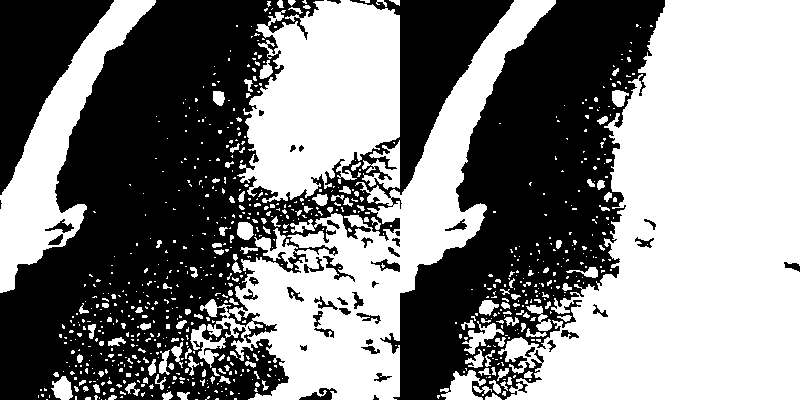

In [148]:
mosaicview(Gray.(img .> edges[110]) .* .! land_mask.non_dilated,
    Gray.(img .> edges[99]) .* .! land_mask.non_dilated, nrow=1)

# Some alternatives at this point:
- Otsu binarization -- used a lot with sea ice, assumes bimodal distribution (so we could check for that first)
- Adaptive threshold binarization -- used in Ellen's paper, better at finding local bright patches.

[ Info: Darkening water and insterstitial ice in morphological result


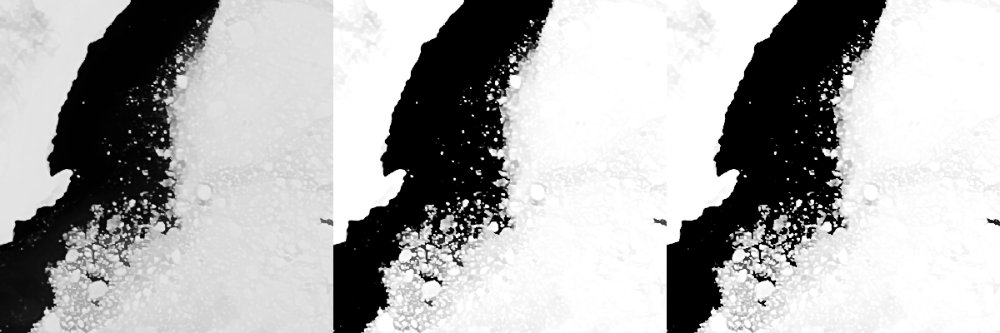

In [150]:
@info "Darkening water and insterstitial ice in morphological result"
# cast to float to avoid issues with N0f8 integer rollover
reconstructed_complement .= float64.(complement.(gray_brightest))
init_green = float64.(green.(tc_img))
# bright areas in the reconstructed complement are water and interstitial ice.
adjustment_mask = (reconstructed_complement .- init_green ) .> 0
reconstructed_complement[adjustment_mask] .=  clamp.(1.2 .* reconstructed_complement[adjustment_mask], 0, 1);
# clamp!(reconstructed_complement, 0, 1)
mosaicview(morphed_gray, gray_brightest, complement.(reconstructed_complement), nrow=1)

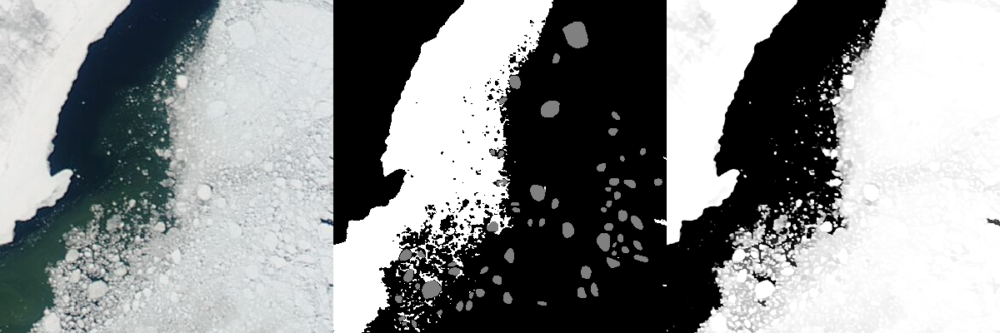

In [151]:
mosaicview(tc_img, complement.(binarize(tc_img, Otsu())) .+ 0.5 .* case.validated_binary_floes,
   Gray.(gray_brightest) .+ 0.5 .* case.validated_binary_floes, nrow=1)

In [156]:
percentile(vec(gmag), 75)

0.01296432589537827

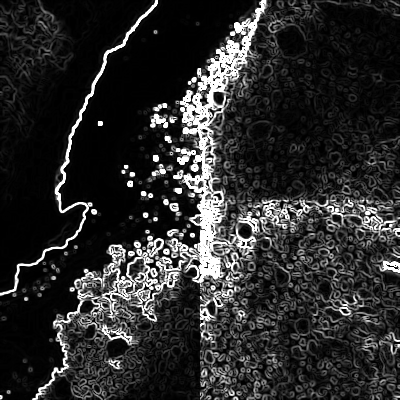

In [160]:
Gx, Gy = imgradients(morphed_gray,  KernelFactors.sobel, "replicate")
gmag = hypot.(Gx, Gy)
for tile in tiles
    gmag[tile...] .= gmag[tile...] ./ percentile(vec(gmag[tile...]), 95) # local max, smoothed?
end
Gray.(gmag)

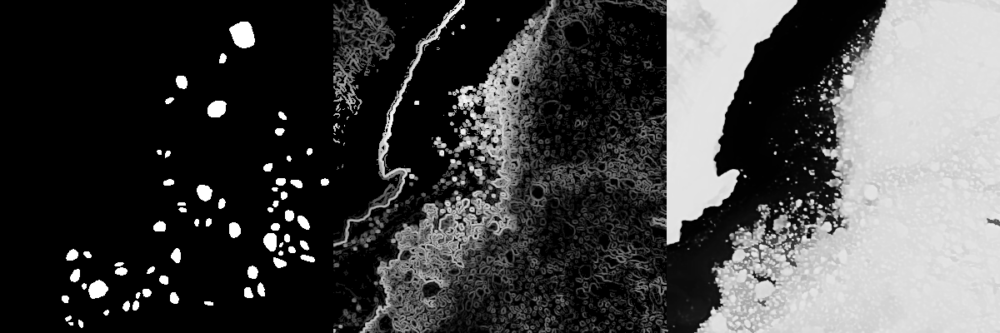

In [183]:
# local_max = ImageMorphology.local_maxima(reconstructed_complement; connectivity=1) .> 0;
# Gray.(local_max)
gmag = hypot.(Gx, Gy)
gmag_eq = Gray.(adjust_histogram(gmag, AdaptiveEqualization(clip=0.85, rblocks=4, cblocks=4)))
mosaicview(Gray.(case.validated_binary_floes), gmag_eq, morphed_gray, nrow=1)

In [184]:
using Random

# Produce an image by replacing values inside a segment with the segment mean color
function view_seg(s)
    map(i->segment_mean(s,i), labels_map(s))
end
# Return a random color of type RGB{N0f8}
function get_random_color(seed)
    Random.seed!(seed)
    rand(RGB{N0f8})
end

# Assign random colors to each segment (useful if viewing cluster results)
function view_seg_random(s)
    map(i->get_random_color(i), labels_map(s))
end


view_seg_random (generic function with 1 method)

In [166]:
# Function for stitching segments accross tile boundaries
include("../scripts/dev/segmentation.jl")

stitch_clusters (generic function with 3 methods)

In [229]:
@time begin
test_img = deepcopy(morphed_adjusted)
# test_img[bin_img .< 1] .= 0.5 .* test_img[bin_img .< 1]
# test_img = Gray.(tc_img) .* 0.5 .* bin_img
segments = zeros(Int64, size(tc_img))
k = 5
idx = 0
for tile in filtered_tiles
    # This is pretty fast by itself.
    # The question is whether it is better 
    segments[tile...] = IceFloeTracker.kmeans_segmentation(float64.(test_img[tile...]), k=k) .+ (idx*k)
    idx += 1
end

# quality metrics for k = 3, 4, 5?
# test of whether sea ice present in tile?
end

  0.025130 seconds (469 allocations: 26.453 MiB)


In [230]:
include("../scripts/dev/segmentation.jl")

stitch_clusters (generic function with 3 methods)

In [231]:
# alt_tiles = IceFloeTracker.get_tiles(tc_img, 650)
bin_img = tiled_adaptive_binarization(Gray.(tc_img), tiles;
    minimum_window_size=100, minimum_brightness=0.3 , threshold_percentage=0);
bin_img .= bin_img .* .! land_mask.non_dilated

save("test_img_tiled_adaptive.png", bin_img)
tc_seg = SegmentedImage(tc_img, label_components(segments))
tc_seg_stitched = SegmentedImage(tc_img, label_components(stitch_clusters(tiles, tc_seg)))
bdry_seg = SegmentedImage(gmag_eq, tc_seg_stitched.image_indexmap)
local_max_seg = SegmentedImage(bin_img, tc_seg_stitched.image_indexmap)
gray_seg = SegmentedImage(morphed_gray, tc_seg_stitched.image_indexmap);

In [232]:
save("test_img_stitched.png", view_seg_random(tc_seg_stitched));

In [233]:
save("test_img_morphed.png", test_img);

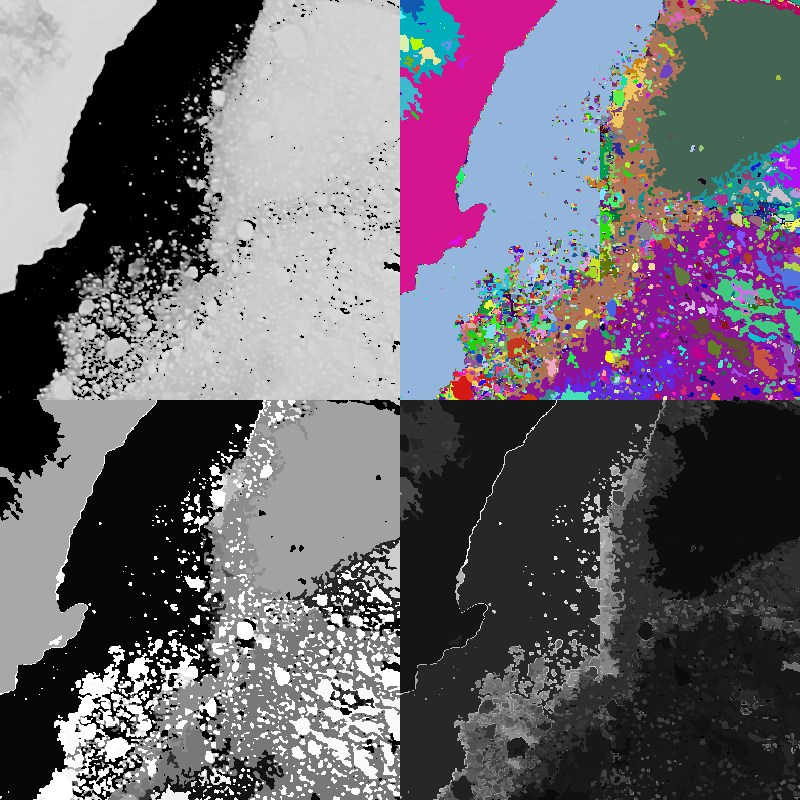

In [235]:
mosaicview(morphed_adjusted, view_seg(local_max_seg), view_seg_random(tc_seg_stitched), view_seg(bdry_seg), nrow=2)

In [204]:
# Categories: 
# Water (tc_img mean red channel l

# Remove segments if they are more than 10 percent boundary pixels and they are smaller than 10 pixels
rem_labels = [s for s in bdry_seg.segment_labels if (bdry_seg.segment_means[s] > 0.1 && bdry_seg.segment_pixel_count[s] < 10)];

In [205]:
# Keep labels if they are more than 50% bright ice pixels and larger than 10 pixels
keep_labels = [s for s in segment_labels(gray_seg)
                    if segment_mean(gray_seg, s) > 0.5 && 
                       segment_pixel_count(gray_seg, s) > 64];

In [206]:
length(rem_labels)
diff_fn(rlab, nlab) = segment_mean(bdry_seg, nlab) - segment_mean(bdry_seg, rlab);
new_seg = prune_segments(bdry_seg, rem_labels, diff_fn);

new_map = zeros(Int64, size(gray_seg.image_indexmap))
for ii in keep_labels
    idx = gray_seg.image_indexmap .== ii
    new_map[idx] .= ii
end
new_map .= new_map .* .! cloud_mask

small_objects = zeros(Int64, size(gray_seg.image_indexmap))
for ii in keep_labels
    if segment_pixel_count(gray_seg, ii) < 64
        idx = gray_seg.image_indexmap .== ii 
        small_objects[idx] .= ii
    end
end
test_seg_1 = SegmentedImage(bin_img, new_seg.image_indexmap)
test_seg_2 = SegmentedImage(bin_img, new_map)

Segmented Image with:
  labels map: 400×400 Matrix{Int64}
  number of labels: 101

What's in the watershed function:
```
    seg = -IceFloeTracker.bwdist(.!bw)
    mask2 = imextendedmin(seg)
    seg = impose_minima(seg, mask2)
    cc = label_components(imregionalmin(seg), trues(3, 3))
    w = ImageSegmentation.watershed(seg, cc)
    lmap = labels_map(w)
    return Images.isboundary(lmap) .> 0
```

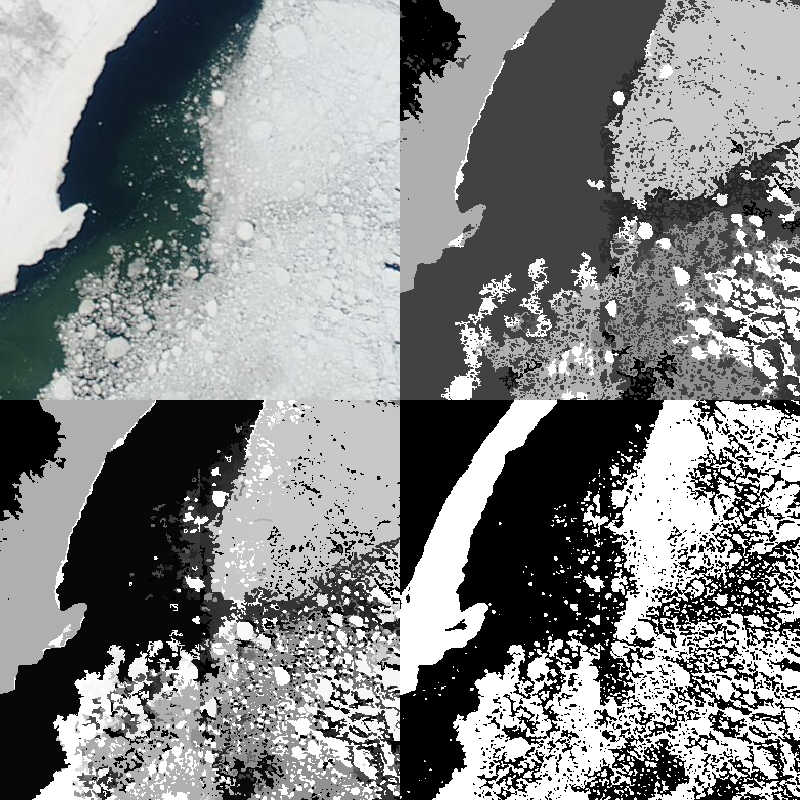

In [207]:
test_img = view_seg(test_seg_1)
# test_img[test_seg.image_indexmap .== 0] .= 0
# test_img[local_max .> 0] .= 0
mosaicview(tc_img, view_seg(test_seg_1), view_seg(test_seg_2), Gray.(bin_img), nrow=2)

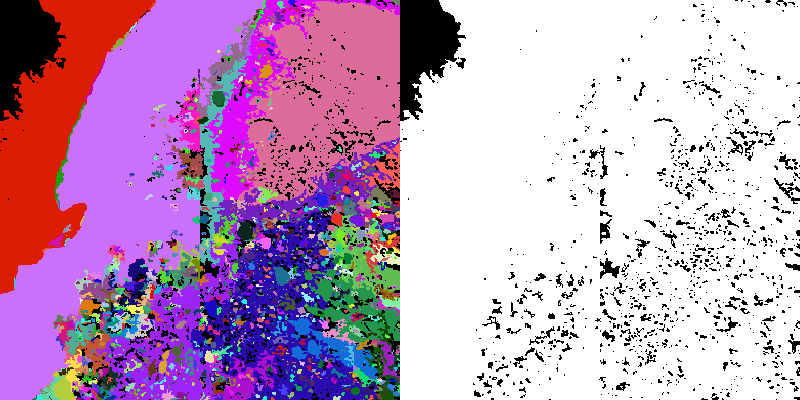

In [209]:
local_min = ImageMorphology.local_minima(test_img; connectivity=1) .> 0;
mosaicview(view_seg_random(test_seg_1) .* .!local_min, Gray.(.!local_min), nrow=1)

Left: Result of k-means and lots of pruning steps. Right: simple adaptive binary threshold

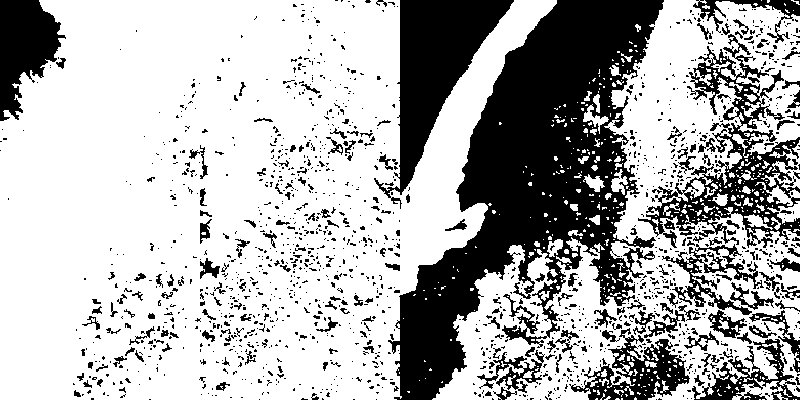

In [224]:

prelim_icemask = Gray.(view_seg_random(test_seg_2) .* .!local_min) .> 0
print("Left: Result of k-means and lots of pruning steps. Right: simple adaptive binary threshold")
mosaicview(Gray.(prelim_icemask), Gray.(bin_img .* .! cloud_mask), nrow=1)

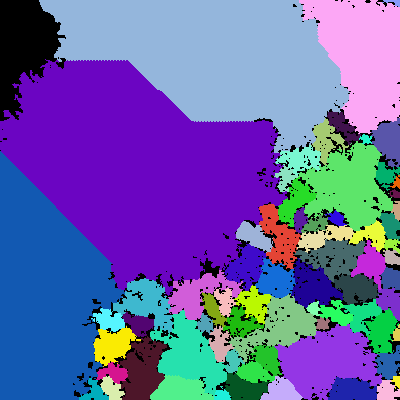

In [212]:
bw = deepcopy(prelim_icemask)
IceFloeTracker.fillholes!(bw)
seg = -IceFloeTracker.bwdist(.!bw)
mask2 = IceFloeTracker.imextendedmin(seg)
seg = IceFloeTracker.impose_minima(seg, mask2)
cc = SegmentedImage(bin_img, label_components( IceFloeTracker.imregionalmin(seg), trues(3, 3)))
w1 = ImageSegmentation.watershed(seg, cc.image_indexmap)
stage_one = view_seg_random(w1) .* bw
# mosaicview(0.5 .* Gray.(bw) .+ 0.5 .* view_seg_random(cc), 
#     0.5 .* Gray.(bw) .+ 0.5 .*view_seg_random(w1), stage_one,
#     0.75 .* img .+ 0.5 .* stage_one, nrow=2)

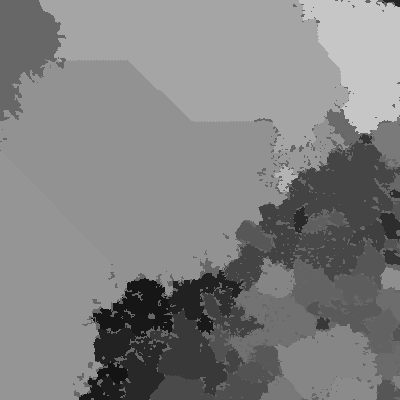

In [215]:
regional_min_img = Gray.(IceFloeTracker.Morphology.imregionalmin(gmag_eq))
X = view_seg(SegmentedImage(regional_min_img, w1.image_indexmap .* bw))

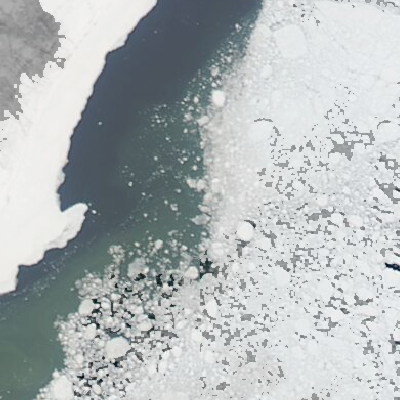

In [216]:
mosaicview(0.75 .* tc_img .+ 0.25 .* opening(Gray.(bw)), nrow=1)

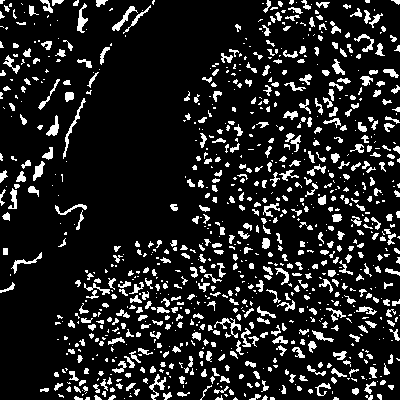

In [218]:
morph_residue = deepcopy(img) .* .! cloud_mask
se_init = collect(strel_diamond((5,5)))
se_box = collect(strel_box((3, 3))) # default strel from sk_morphology
mr_reconst = mreconstruct(dilate,
                          erode(morph_residue, se_init),
                          morph_residue,
                          se_box)
mr_reconst .= complement.(mreconstruct(dilate,
                                complement.(dilate(mr_reconst, se_init)), 
                                complement.(mr_reconst),
                                se_box))
local_max = ImageMorphology.local_maxima(mr_reconst; connectivity=1) .> 0
# local_max .= erode(local_max, strel_diamond((3,3)))

# local_max .= IceFloeTracker.branchbridge(local_max)
# IceFloeTracker.hbreak!(local_max)
Gray.(local_max)

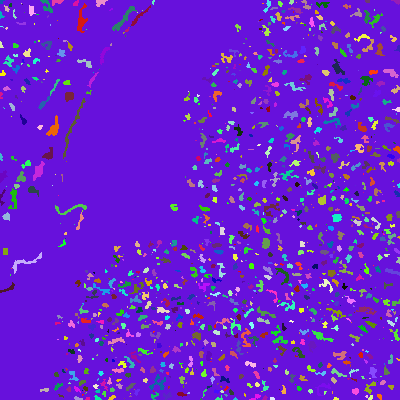

In [219]:
view_seg_random(SegmentedImage(tc_img, label_components(local_max))) # connectivity choice here?

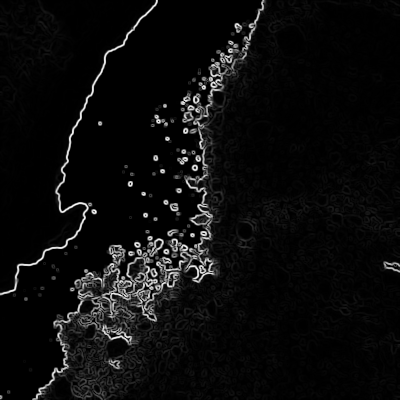

In [220]:
mr_equalized = adjust_histogram(morph_residue, Equalization(nbins = 256, minval = 0, maxval = 1))
Gx, Gy = imgradients(morph_residue,  KernelFactors.sobel, "replicate")
gmag = hypot.(Gx, Gy)
gmag .= gmag ./ maximum(gmag)
Gray.(gmag)

In [221]:
minimamarkers = opening(local_max) #.| segment_mask .| ice_mask
gmag .= IceFloeTracker.impose_minima(gmag, minimamarkers)
cc = label_components(IceFloeTracker.imregionalmin(gmag), trues(3, 3))
w2 = ImageSegmentation.watershed(morph_residue, cc)

Segmented Image with:
  labels map: 400×400 Matrix{Int64}
  number of labels: 662

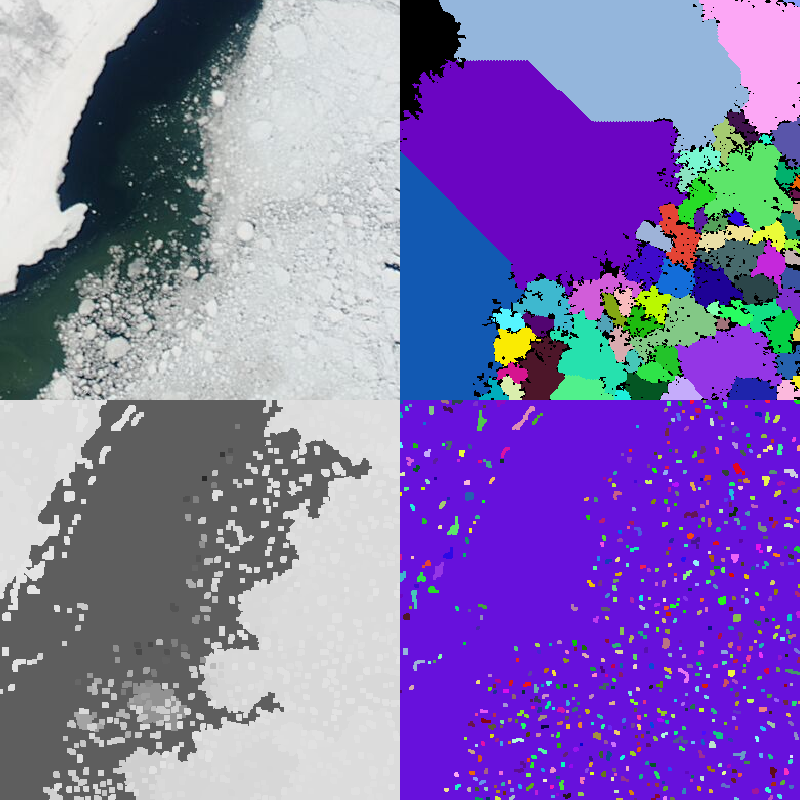

In [222]:
mosaicview(tc_img, view_seg(w2), stage_one, view_seg_random(SegmentedImage(morph_residue, cc)), nrow=2)

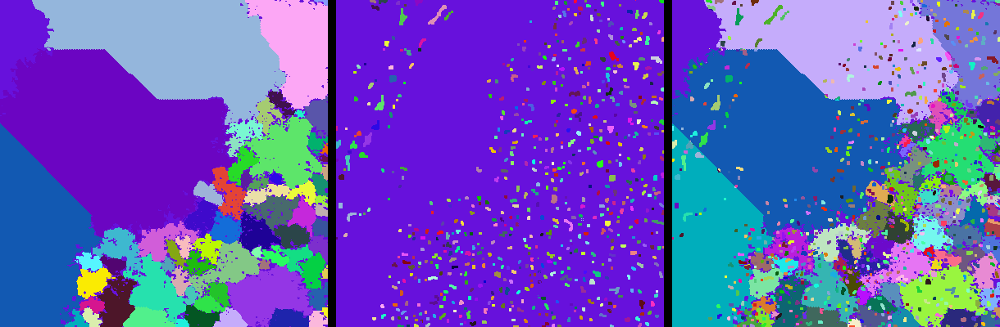

In [223]:
w2_idx = SegmentedImage(morph_residue, cc).image_indexmap
w2_idx .= w2_idx .* bw
w1_idx = w1.image_indexmap .* bw
mosaicview(view_seg_random(SegmentedImage(morph_residue, w1_idx )), 
    view_seg_random(SegmentedImage(morph_residue, w2_idx)),
    view_seg_random(SegmentedImage(morph_residue, label_components(w1_idx .+ w2_idx))), nrow=1, npad=10) 

# Things other papers have done for this merging step
- Region adjacency graph, compare to neighbors, function that tests the whether the objects are similar enough
- Region growing algorithm, penalize crossing detected edges
- Cleaning the shapes using a structuring element that is a function of the floe size
- Local morphological cleanup based on the boundary type

In [429]:
joined_seg = SegmentedImage(morph_residue, label_components(w1_idx .+ w2_idx))
RAG = region_adjacency_graph(joined_seg)

LoadError: MethodError: no method matching region_adjacency_graph(::SegmentedImage{Matrix{Int64}, Gray{Float32}})
The function `region_adjacency_graph` exists, but no method is defined for this combination of argument types.

[0mClosest candidates are:
[0m  region_adjacency_graph(::SegmentedImage, [91m::Function[39m)
[0m[90m   @[39m [35mImageSegmentation[39m [90m~/.julia/packages/ImageSegmentation/T47s5/src/[39m[90m[4mcore.jl:122[24m[39m
[0m  region_adjacency_graph([91m::AbstractArray{CT, N}[39m, [91m::Function[39m, [91m::Int64[39m) where {CT<:Union{Real, Colorant}, N}
[0m[90m   @[39m [35mImageSegmentation[39m [90m~/.julia/packages/ImageSegmentation/T47s5/src/[39m[90m[4mcore.jl:417[24m[39m
[0m  region_adjacency_graph([91m::AbstractArray{CT, N}[39m, [91m::Function[39m, [91m::CartesianIndex{N}[39m) where {CT<:Union{Real, Colorant}, N}
[0m[90m   @[39m [35mImageSegmentation[39m [90m~/.julia/packages/ImageSegmentation/T47s5/src/[39m[90m[4mcore.jl:391[24m[39m


In [ ]:
IceFloeTracker.skimage

What we are looking at in the above image is two candidate segmentations using watershed transformations and morphological operations: the far left one is from the k-means processing (watershed1) and the center is from the morphological reconstruction method (watershed 2). On the right, we have a segmentation formed from intersecting both segmentation results. It is (apparently) a common approach to oversegment, then to find the pieces of the puzzle that stay together across multiple segmentation approaches. We can see that there is disagreement at the boundaries, and that there are some floes that are more aggressively segmented in one method than in the other. By and large though, the intersection appears to be better than the individual results in most cases.

What techniques do others use to find the best segmentation result from static images?

Some ideas:
* Does the object stay connected after X number of erosions? If not, relabel and regrow
* Another watershed method, using the skeletonization https://stackoverflow.com/questions/22791333/determining-bottleneck-image-regions-using-scipy 



In [403]:
skel = Images.thinning(local_max);

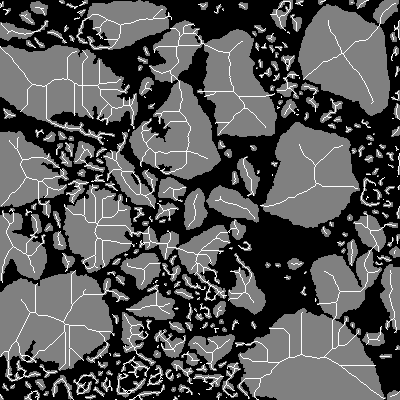

In [404]:
Gray.(local_max .* 0.5 .+ skel)

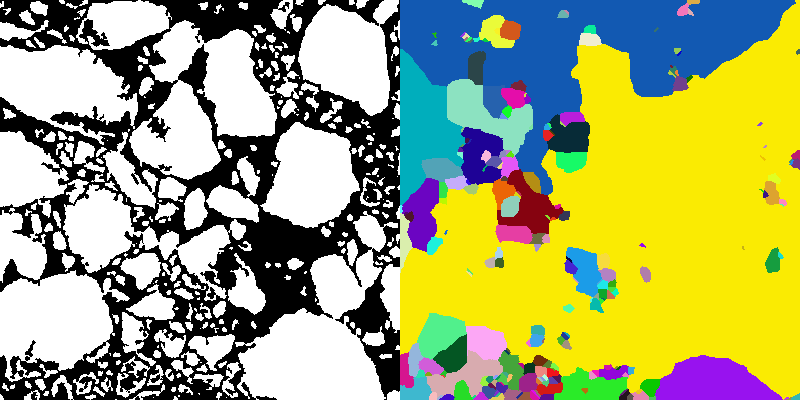

In [423]:
dist_skel = IceFloeTracker.bwdist(skel) .> 3
w = watershed(skel, label_components(dist_skel))
mosaicview(Gray.(local_max), view_seg_random(w), ncol=2)

So what we have so far is
- kmeans to get potential image segments
- gradients to get the boundary pixels and remove those from consideration
- fraction of bright ice pixels to get possible ice floes

Next, I want to
- check each floe on whether it is foreground or background by comparing the mean brightness to the brightness of it's boundary. So that could be done by grabbing the object, padding it, selecting the enhanced grayscale image intersecting with the dilated padded object, and checking if it is at least some threshold brighter. If not, call it background.
- Fill holes based on a distance transform method. A melt pond in the center of a floe, for example, is a dark patch with no neighbors nearby. So we could use a region adjacency graph to look for segments with only one neighbor.
- Then use the watershed segmentation to separate large floes.

Question: what would be the right way to merge floes together again?

Clockwise from top left: True color, gradients averaged in segments, fraction of binarized image within floes, random colors of the stitched TC seg, segment colors for the grayscale seg, and random colors after pruning boundaries.

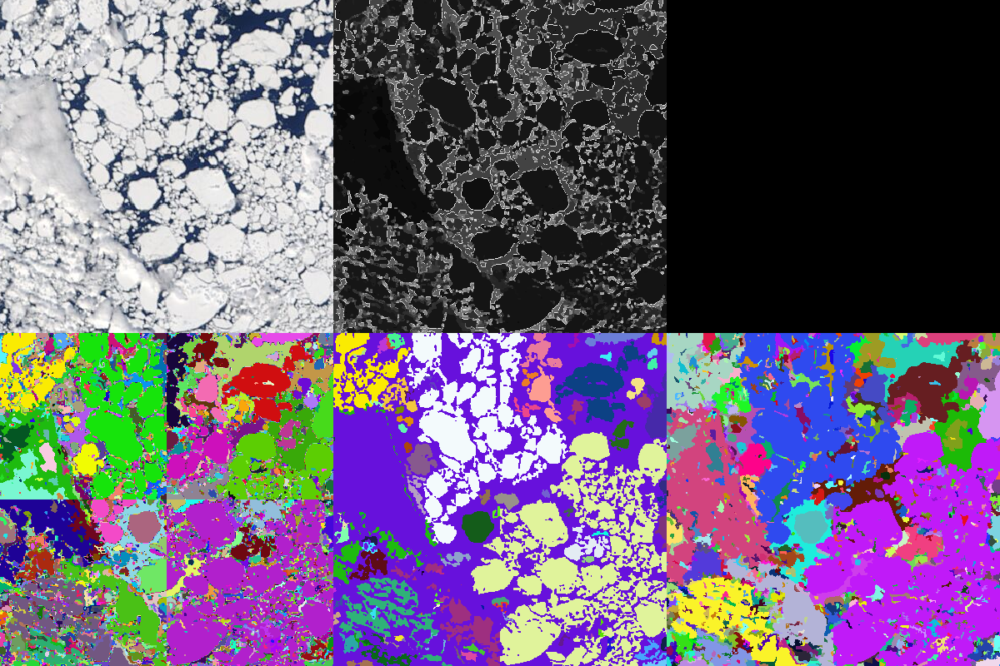

In [301]:
print("Clockwise from top left: True color, gradients averaged in segments, fraction of binarized image within floes, random colors of the stitched TC seg, segment colors for the grayscale seg, and random colors after pruning boundaries.")
mosaicview(tc_img, view_seg_random(tc_seg), view_seg(bdry_seg),
            view_seg_random(test_seg) .* .! (small_objects .> 0), Gray.(small_objects .> 0), view_seg_random(new_seg), nrow=2)

If we consider the distance to objects of a different type, we can use that information to distinguish between shadows and melt points within large floes vs the bits of noisy boundary fragments in the interstitial ice. 

In [302]:
length(keep_labels)

93

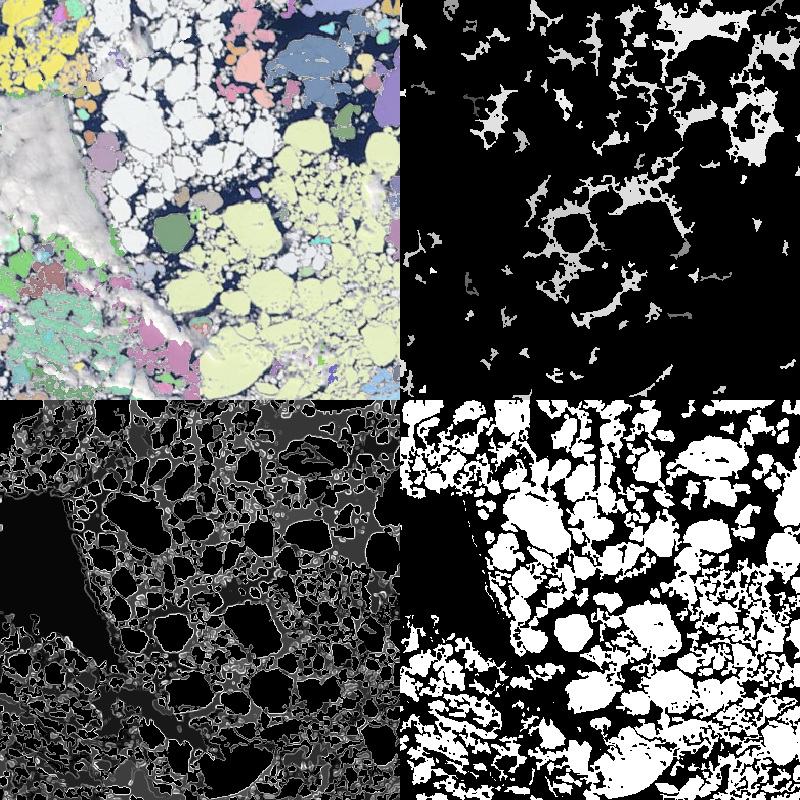

In [303]:
tc_img_cp = deepcopy(tc_img)
test_overlay = view_seg_random(test_seg) .* (new_map .!= 0)
tc_img_cp[new_map .!= 0] .= 0.5 .* test_overlay[new_map .!= 0] .+ 0.5 .* tc_img_cp[new_map .!= 0]
mosaicview(tc_img_cp, gmag, view_seg(local_max_seg), Gray.(test_seg.image_indexmap .> 0) .- 0.5 .* view_seg(local_max_seg),  nrow=2)

So - does the segmentation help us more than the binarization does? What can I do with the edge gradient information? Tag and watershed? Use Ellen's / Alexis' method?

In [280]:
using IceFloeTracker: LopezAcosta2019, LopezAcosta2019Tiling

In [294]:
older_seg = LopezAcosta2019()
tiling_seg = LopezAcosta2019Tiling()

LopezAcosta2019Tiling((rblocks = 2, cblocks = 2), (prelim_threshold = 0.43137254901960786, band_7_threshold = 0.7843137254901961, band_2_threshold = 0.7450980392156863, ratio_lower = 0.0, ratio_offset = 0.0, ratio_upper = 0.75), (white_threshold = 25.5, entropy_threshold = 4, white_fraction_threshold = 0.4), (gamma = 1.5, gamma_factor = 1.3, gamma_threshold = 220), (se_disk1 = Bool[0 1 0; 1 1 1; 0 1 0], se_disk2 = Bool[0 0 … 0 0; 0 1 … 1 0; … ; 0 1 … 1 0; 0 0 … 0 0], se_disk4 = Bool[0 0 … 0 0; 0 1 … 1 0; … ; 0 1 … 1 0; 0 0 … 0 0]), (radius = 10, amount = 2.0, factor = 255.0), (band_7_threshold = 0.0196078431372549, band_2_threshold = 0.9019607843137255, band_1_threshold = 0.9411764705882353, band_7_threshold_relaxed = 0.0392156862745098, band_1_threshold_relaxed = 0.7450980392156863, possible_ice_threshold = 0.29411764705882354, k = 3), (radius = 10, amount = 2, factor = 0.5), 0.1)

In [286]:
older_result = older_seg(tc_img, fc_img, lm_img)

[ Info: building landmask
[ Info: Building cloudmask
[ Info: Finding ice labels
[ Info: Sharpening truecolor image
[ Info: Normalizing truecolor image
[ Info: Discriminating ice/water
[ Info: Segmenting floes part 1/3
[ Info: Segmenting floes part 2/3
[ Info: Building watersheds
[ Info: Segmenting floes part 3/3
[ Info: Done with k-means segmentation
[ Info: Labeling floes


Segmented Image with:
  labels map: 1001×1001 Matrix{Int64}
  number of labels: 153

In [287]:
# The fact that this is throwing an error is surprising. It should "just work".
tiling_result = tiling_seg(tc_img, fc_img, lm_img);

LoadError: ArgumentError: k must be from 1:n (n=1), k=3 given.

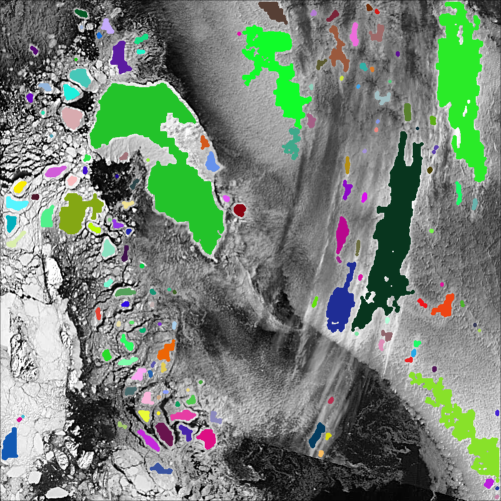

In [291]:
# man_labels = case.validated_binary_floes
# outlines = man_labels .- erode(man_labels)
seg_img = view_seg_random(older_result)
overlay_img = deepcopy(init_grayscale)
overlay_img[older_result.image_indexmap .> 0] .= 0
seg_img[older_result.image_indexmap .== 0] .= 0
mosaicview( seg_img .+ overlay_img)

This is the performance of the "original" algorithm -- the older LA2019 algorithm that is supposed to match the matlab output. It does seem to get pretty close. 

In [296]:
# Large image
# Image took 9 minutes to run on my desktop, no optimization applied

tc_img = RGB.(load("../../data/modis_data/20140427/20140427.aqua.truecolor.250m.tiff"))
fc_img = RGB.(load("../../data/modis_data/20140427/20140427.aqua.falsecolor.250m.tiff"))
lm_img = RGB.(load("../../data/modis_data/20140427/landmask.tiff"));

@time begin
    older_result = older_seg(tc_img, fc_img, lm_img) # fully running defaults here!
end

[ Info: building landmask
[ Info: Building cloudmask
[ Info: Finding ice labels
[ Info: Sharpening truecolor image
[ Info: Normalizing truecolor image
[ Info: Discriminating ice/water
[ Info: Segmenting floes part 1/3
[ Info: Segmenting floes part 2/3
[ Info: Building watersheds
[ Info: Segmenting floes part 3/3
[ Info: Done with k-means segmentation
[ Info: Labeling floes


582.301578 seconds (103.40 M allocations: 1.091 TiB, 20.78% gc time)


Segmented Image with:
  labels map: 5680×3392 Matrix{Int64}
  number of labels: 1368

In [298]:
seg_img = view_seg_random(older_result)
overlay_img = deepcopy(Gray.(tc_img))
overlay_img[older_result.image_indexmap .> 0] .= 0
seg_img[older_result.image_indexmap .== 0] .= 0
save("../../20140427.aqua.segmented.png", mosaicview( seg_img .+ overlay_img))

In [299]:
comp_binarized = binarize(Gray.(tc_img), AdaptiveThreshold(;window_size=400, percentage=0))
save("../../20140427.aqua.adaptive_binarization.png", Gray.(comp_binarized))

In [301]:
tc_img = RGB.(load("../../data/modis_data/20140427/20140427.terra.truecolor.250m.tiff"))
fc_img = RGB.(load("../../data/modis_data/20140427/20140427.terra.falsecolor.250m.tiff"))
lm_img = RGB.(load("../../data/modis_data/20140427/landmask.tiff"));

@time begin
    terra_result = older_seg(tc_img, fc_img, lm_img) # fully running defaults here!
end

[ Info: building landmask
[ Info: Building cloudmask
[ Info: Finding ice labels
[ Info: Sharpening truecolor image
[ Info: Normalizing truecolor image
[ Info: Discriminating ice/water
[ Info: Segmenting floes part 1/3
[ Info: Segmenting floes part 2/3
[ Info: Building watersheds
[ Info: Segmenting floes part 3/3
[ Info: Done with k-means segmentation
[ Info: Labeling floes


490.268408 seconds (100.61 M allocations: 1.092 TiB, 6.56% gc time)


Segmented Image with:
  labels map: 5680×3392 Matrix{Int64}
  number of labels: 1439

In [305]:
terra_seg_img = view_seg_random(terra_result)
terra_overlay_img = deepcopy(Gray.(tc_img))
terra_overlay_img[terra_result.image_indexmap .> 0] .= 0
terra_seg_img[terra_result.image_indexmap .== 0] .= 0
save("../../20140427.terra.segmented.png", mosaicview(terra_seg_img .+ terra_overlay_img))
comp_binarized = binarize(Gray.(tc_img), AdaptiveThreshold(;window_size=400, percentage=0))
save("../../20140427.terra.adaptive_binarization.png", Gray.(comp_binarized))